# Capstone Project - The Battle of the Neighborhoods (Week 2)

## Applied Data Science Capstone by IBM/Coursera

## Table of contents
1. [Introduction: Business Problem](#Introduction)
2. [Data](#data)
3. [Methodology](#methodology)
4. [Analysis](#analysis)
5. [Results and Discussion](#results)
6. [Conclusion](#conclusion)

## 1. Introduction: Business Problem  <a name="Introduction"></a>

In this project, we will discover where a restaurant owner can open his **African restaurant** in **New York**.

Due to the number of restaurants in this city, we will find an optimal location where there are **no African restaurants** and where there are **fewer other restaurants**.

To gain more **customers**, it is necessary to be in an area where there are **many people**. For this reason, we will try to find a place as close as possible to the **city**.

## 2. Data <a name="data"></a>

To succeed in our work, we have a few points to respect. These points are as follows: 
+ finding a place where there are fewer other restaurants
- to find a place where there are no African restaurants (if possible)
- to be much closer to the center

To do this, we need to know:
- the number of restaurants of all kinds in each neighborhood
- the number of African restaurants in each neighbourhood
- the distance of each neighbourhood from the centre

**The data we will need:** <br>
- We will use **Foursquare API** to find information on neighborhoods and restaurants in New York.
- We will also use **Geopy** library to get the latitude and longitude of New York
- We'll download data on New York neighborhoods
- We'll also download data on New York borough with its population data

## Libraries and dependencies

First of all, let's import all libraries and dependencies we will need

In [2]:
import numpy as np # library to handle data in a vectorized manner

import pandas as pd # library for data analsysis
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

import json # library to handle JSON files

import seaborn as sns
import matplotlib.pyplot as plt

#!conda install -c conda-forge geopy --yes # uncomment this line if you haven't completed the Foursquare API lab
from geopy.geocoders import Nominatim # convert an address into latitude and longitude values

import requests # library to handle requests
from pandas.io.json import json_normalize # tranform JSON file into a pandas dataframe

# Matplotlib and associated plotting modules
import matplotlib.cm as cm
import matplotlib.colors as colors

# import k-means from clustering stage
from sklearn.cluster import KMeans

#!conda install -c conda-forge folium=0.5.0 --yes # uncomment this line if you haven't completed the Foursquare API lab
import folium # map rendering library

from random import randint

print('Libraries imported.')

/usr/local/lib/python3.6/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


Libraries imported.


### New York coordinates

To start, let's get the coordinates for New York...
We use geopy library to get the latitude and longitude values of New York City.

In [3]:
address = 'New York City, NY'

geolocator = Nominatim(user_agent='ny_explorer')
location   = geolocator.geocode(address)
latitude   = location.latitude
longitude  = location.longitude
print("The geographical coordinate of New York are {}, {}.".format(latitude, longitude))

The geographical coordinate of New York are 40.7127281, -74.0060152.


## Load and explore the data of New York neighborhoods

First of all, let's get the data on New York neighborhoods

In [0]:
with open('newyork_data.json') as json_data:
    newyork_data = json.load(json_data)
state_geo_ny = newyork_data.copy()
neighborhoods_data = newyork_data['features']

# define the dataframe columns
column_names = ['Borough', 'Neighborhood', 'Latitude', 'Longitude'] 

# instantiate the dataframe
neighborhoods = pd.DataFrame(columns=column_names)

Let's take a quick look at the data.

In [0]:
for data in neighborhoods_data:
    borough = data['properties']['borough'] 
    neighborhood_name = data['properties']['name']
        
    neighborhood_latlon = data['geometry']['coordinates']
    neighborhood_lat = neighborhood_latlon[1]
    neighborhood_lon = neighborhood_latlon[0]
    
    neighborhoods = neighborhoods.append({'Borough': borough,
                                          'Neighborhood': neighborhood_name,
                                          'Latitude': neighborhood_lat,
                                          'Longitude': neighborhood_lon}, ignore_index=True)

In [0]:
newyork_data = neighborhoods.copy()

Let's take a look 

In [7]:
newyork_data.head()

,Borough,Neighborhood,Latitude,Longitude
0,Bronx,Wakefield,40.894705,-73.847201
1,Bronx,Co-op City,40.874294,-73.829939
2,Bronx,Eastchester,40.887556,-73.827806
3,Bronx,Fieldston,40.895437,-73.905643
4,Bronx,Riverdale,40.890834,-73.912585


Let's check the number of neighborhoods and Boroughs in New York City

In [8]:
print("Number of Neighborhoods is {} ".format(newyork_data.shape[0]))
print("Number of Boroughs is {} ".format(len(newyork_data['Borough'].unique())))

Number of Neighborhoods is 306 
Number of Boroughs is 5 


### Create a map of New York with neighborhoods superimposed on top

In [9]:
# create map of New York using latitude and longitude values
nw_map = folium.Map(location=[latitude, longitude], zoom_start=11)

colors = {}

for n in newyork_data['Borough'].unique():
    colors[n] = ('#%06X' % randint(0, 0xFFFFFF))

# add markers to map
for lat, lng, borough, neighborhood in zip(newyork_data['Latitude'], newyork_data['Longitude'], newyork_data['Borough'], newyork_data['Neighborhood']):
    label = '{}, {}'.format(neighborhood, borough)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color= colors[borough],
        fill=True,
        fill_color= colors[borough],
        fill_opacity=0.7,
        parse_html=False).add_to(nw_map)  
    
nw_map

## Foursquare

Now, we're going to start using the Foursquare API to explore the neighborhoods 

Define Foursquare Credentials and Version

In [10]:
CLIENT_ID = '44YT4QQ0X0QPIVZTYBHFW0BKPWRTAJWH4ZRFHVPDMWLDWIUQ' # your Foursquare ID
CLIENT_SECRET = 'CMZGX3RSFGW204ZBYCO1QESDSKQRGPEUUUY0W1XTWQJYF01A' # your Foursquare Secret
VERSION = '20180605' # Foursquare API version

print('Your credentails:')
print('CLIENT_ID: ' + CLIENT_ID)
print('CLIENT_SECRET:' + CLIENT_SECRET)

Your credentails:
CLIENT_ID: 44YT4QQ0X0QPIVZTYBHFW0BKPWRTAJWH4ZRFHVPDMWLDWIUQ
CLIENT_SECRET:CMZGX3RSFGW204ZBYCO1QESDSKQRGPEUUUY0W1XTWQJYF01A


Let's explore the first neighborhood in our dataframe

In [0]:
newyork_data.set_index('Neighborhood', inplace=True)

In [12]:
newyork_data.head()

,Borough,Latitude,Longitude
Neighborhood,,,
Wakefield,Bronx,40.894705,-73.847201
Co-op City,Bronx,40.874294,-73.829939
Eastchester,Bronx,40.887556,-73.827806
Fieldston,Bronx,40.895437,-73.905643
Riverdale,Bronx,40.890834,-73.912585


Get the latitude and longitude values of **Wakefield** Neighborhood 

In [16]:
neighborhood_latitude = newyork_data.loc['Wakefield', 'Latitude']
neighborhood_longitude = newyork_data.loc['Wakefield', 'Longitude']

print("Latitude and longitude values of Wakefield are {}, {}".format(neighborhood_latitude, neighborhood_longitude))

Latitude and longitude values of Wakefield are 40.89470517661, -73.84720052054902


As we are looking for **African restaurants**, we have to focus on restaurants in the **food** category of Foursquare.

In [0]:
# Category IDs corresponding to Italian restaurants were taken from Foursquare web site (https://developer.foursquare.com/docs/resources/categories):

food_category = '4d4b7105d754a06374d81259' # 'Root' category for all food-related venues

african_restaurant_categories = ['4bf58dd8d48988d1c8941735', '4bf58dd8d48988d10a941735']


First, let's create  the GET request URL.

In [18]:
LIMIT = 100 # limit of number of venues returned by Foursquare API
radius= 500 # define radius

url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&categoryId={}&radius={}&limit={}'.format(
    CLIENT_ID, 
    CLIENT_SECRET, 
    VERSION, 
    neighborhood_latitude, 
    neighborhood_longitude, 
    food_category,
    radius, 
    LIMIT)
url

'https://api.foursquare.com/v2/venues/explore?&client_id=44YT4QQ0X0QPIVZTYBHFW0BKPWRTAJWH4ZRFHVPDMWLDWIUQ&client_secret=CMZGX3RSFGW204ZBYCO1QESDSKQRGPEUUUY0W1XTWQJYF01A&v=20180605&ll=40.89470517661,-73.84720052054902&categoryId=4d4b7105d754a06374d81259&radius=500&limit=100'

Now let's send the GET request and examine the results 

In [0]:
results = requests.get(url).json()

All the information is in the items key. Before we proceed, let's define a function that extracts the category of the venue

In [0]:
def get_category_type(row):
  try:
    categories_list = row['categories']
  except:
    categories_list = row['venue.categories']
  
  if len(categories_list) == 0:
    return None
  else:
    return categories_list[0]['name']

Now, let's clean the json and structure it into a pandas dataframe

In [21]:
venues = results['response']['groups'][0]['items']

nearby_venues = pd.json_normalize(venues) # flatten JSON

# filter columns
filter_columns = ['venue.name', 'venue.categories', 'venue.location.lat', 'venue.location.lng']
nearby_venues  = nearby_venues.loc[:, filter_columns]

# filter the category for each row
nearby_venues['venue.categories'] = nearby_venues.apply(get_category_type, axis=1)

# clean columns
nearby_venues.columns = [col.split(".")[-1] for col in nearby_venues.columns]

nearby_venues.head()

,name,categories,lat,lng
0,Dunkin',Donut Shop,40.890459,-73.849089
1,Subway,Sandwich Place,40.890468,-73.849152
2,Pitman Deli,Food,40.894149,-73.845748
3,Central Deli,Deli / Bodega,40.896728,-73.844387
4,Louis Pizza,Pizza Place,40.898399,-73.848810


In [22]:
print("{} venues were returned by Foursquare.".format(nearby_venues.shape[0]))

5 venues were returned by Foursquare.


**Now, let's create a function to repeat the same process to all the neighobrhoods in New York**

In [0]:
def get_categories(categories):
    return [[cat['name'], cat['id']] for cat in categories]

# check if it is a restaurant, [and african restaurants]

def is_restaurant(categories):
  '''Return restaurants from categories list'''

  # focus on food restaurants
  restaurant_words = ['restaurant', 'diner', 'steakhouse', 'food', 'taverna', 'sandwich', 'chicken']
  
  # check if it is a restaurant, (and/or) african restaurant
  restaurant, is_african = False, False

  for category in categories:
    for restaurant_word in restaurant_words:
      if restaurant_word in category[0].lower():
        restaurant = True
        if category[1] in african_restaurant_categories:
          is_african = True
    if 'fast food' in category[0].lower():
      restaurant = False

  return restaurant, is_african

def getNearbyVenues(names, latitudes, longitudes):
  ''' Returns from nearby locations '''

  venues_list = []
  for name, lat, lng in zip(names, latitudes, longitudes):
    
    # create the API request URL
    url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&categoryId={}&radius={}&limit={}'.format(
      CLIENT_ID, 
      CLIENT_SECRET, 
      VERSION, 
      lat, 
      lng, 
      food_category,
      radius, 
      LIMIT)
    
    # make the request 
    results = requests.get(url).json()['response']['groups'][0]['items']

    # return only relevant information for each nearby venue
    for v in results:
      categories = get_categories(v['venue']['categories'])

      is_rest, is_african = is_restaurant(categories)

      # get if it is a restaurant
      if(is_rest):
        venues_list.append([
            name,
            lat,
            lng,
            v['venue']['name'],
            v['venue']['location']['lat'],
            v['venue']['location']['lng'],
            v['venue']['categories'][0]['name'],
            v['venue']['categories'][0]['id'],
            v['venue']['location']['distance'],
            is_african
            ])
        
  # construct the dataframe
  nearby_venues = pd.DataFrame(venues_list, columns = ['Neighborhood',
                          'Neighborhood Latitude',
                          'Neighborhood Longitude',
                          'Venue',
                          'Venue Latitude',
                          'Venue Longitude',
                          'Venue Category',
                          'Venue Category Id',
                          'Venue Distance',
                         # 'Venue Address',
                          'Is African']) 
    
  return (nearby_venues)


In [0]:
newyork_data.reset_index(inplace=True)
ny_venues_restaurants = getNearbyVenues(names = newyork_data['Neighborhood'], latitudes=newyork_data['Latitude'], longitudes=newyork_data['Longitude'])

ny_venues_restaurants.head()

[['Wakefield', 40.89470517661, -73.84720052054902, 'Pitman Deli', 40.89414920073695, -73.84574821662589, 'Food', '4d4b7105d754a06374d81259', 136, False], ['Co-op City', 40.87429419303012, -73.82993910812398, 'Townhouse Restaurant', 40.876085887834265, -73.82886815052547, 'Restaurant', '4bf58dd8d48988d1c4941735', 218, False], ['Co-op City', 40.87429419303012, -73.82993910812398, 'Guang Hui Chinese Restaurant', 40.876651, -73.829092, 'Chinese Restaurant', '4bf58dd8d48988d145941735', 271, False], ['Co-op City', 40.87429419303012, -73.82993910812398, 'Seven Seas', 40.87028, -73.828611, 'Restaurant', '4bf58dd8d48988d1c4941735', 460, False], ['Eastchester', 40.887555677350775, -73.82780644716412, 'Fish & Ting', 40.885656, -73.829197, 'Caribbean Restaurant', '4bf58dd8d48988d144941735', 241, False], ['Eastchester', 40.887555677350775, -73.82780644716412, 'Cozy Cottage Restaurant', 40.88633207186384, -73.82761561924221, 'Diner', '4bf58dd8d48988d147941735', 137, False], ['Eastchester', 40.887555

,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category,Venue Category Id,Venue Distance,Is African
0,Wakefield,40.894705,-73.847201,Pitman Deli,40.894149,-73.845748,Food,4d4b7105d754a06374d81259,136,False
1,Co-op City,40.874294,-73.829939,Townhouse Restaurant,40.876086,-73.828868,Restaurant,4bf58dd8d48988d1c4941735,218,False
2,Co-op City,40.874294,-73.829939,Guang Hui Chinese Restaurant,40.876651,-73.829092,Chinese Restaurant,4bf58dd8d48988d145941735,271,False
3,Co-op City,40.874294,-73.829939,Seven Seas,40.870280,-73.828611,Restaurant,4bf58dd8d48988d1c4941735,460,False
4,Eastchester,40.887556,-73.827806,Fish & Ting,40.885656,-73.829197,Caribbean Restaurant,4bf58dd8d48988d144941735,241,False


**In this project, I am focusing only on food restaurants. Fast food, coffee shops, pizza shops are not included here.**


Now that we know the restaurants in New York, let's join each neighborhood with its borough...

In [0]:
restaurants_df = pd.merge(ny_venues_restaurants, newyork_data, on='Neighborhood')

In [26]:
restaurants_df.head()

,Unnamed: 0,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category,Venue Category Id,Venue Distance,Is African,Borough,Latitude,Longitude
0,0,Wakefield,40.894705,-73.847201,Pitman Deli,40.894149,-73.845748,Food,4d4b7105d754a06374d81259,136,False,Bronx,40.894705,-73.847201
1,1,Co-op City,40.874294,-73.829939,Townhouse Restaurant,40.876086,-73.828868,Restaurant,4bf58dd8d48988d1c4941735,218,False,Bronx,40.874294,-73.829939
2,2,Co-op City,40.874294,-73.829939,Guang Hui Chinese Restaurant,40.876651,-73.829092,Chinese Restaurant,4bf58dd8d48988d145941735,271,False,Bronx,40.874294,-73.829939
3,3,Co-op City,40.874294,-73.829939,Seven Seas,40.870280,-73.828611,Restaurant,4bf58dd8d48988d1c4941735,460,False,Bronx,40.874294,-73.829939
4,4,Eastchester,40.887556,-73.827806,Fish & Ting,40.885656,-73.829197,Caribbean Restaurant,4bf58dd8d48988d144941735,241,False,Bronx,40.887556,-73.827806


Let's check the number of restaurants

In [27]:
print("Total number of restaurants:", restaurants_df.shape[0])
print("Total number of African restaurants:", restaurants_df[restaurants_df['Is African'] == True].shape[0])

Total number of restaurants: 4677
Total number of African restaurants: 16


Let's store african and other restaurants in differents dataframes

In [0]:
african_restaurants = restaurants_df[restaurants_df['Is African'] == True]
other_restaurants  = restaurants_df[restaurants_df['Is African'] == False]

Let's display 5 african restaurants

In [29]:
african_restaurants.head()

,Unnamed: 0,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category,Venue Category Id,Venue Distance,Is African,Borough,Latitude,Longitude
94,94,University Heights,40.855727,-73.910416,Accra Resturant,40.853871,-73.908421,African Restaurant,4bf58dd8d48988d1c8941735,266,True,Bronx,40.855727,-73.910416
113,113,Fordham,40.860997,-73.896427,Papaye Restaurant,40.857407,-73.899738,African Restaurant,4bf58dd8d48988d1c8941735,487,True,Bronx,40.860997,-73.896427
378,378,Concourse,40.834284,-73.915589,Papaye Restaurant,40.832420,-73.917956,African Restaurant,4bf58dd8d48988d1c8941735,287,True,Bronx,40.834284,-73.915589
735,735,Cobble Hill,40.687920,-73.998561,Awash Ethiopian Restaurant,40.685740,-73.994393,Ethiopian Restaurant,4bf58dd8d48988d10a941735,427,True,Brooklyn,40.687920,-73.998561
859,859,Fort Greene,40.688527,-73.972906,Bati Ethiopian Restaurant,40.686599,-73.974876,Ethiopian Restaurant,4bf58dd8d48988d10a941735,271,True,Brooklyn,40.688527,-73.972906


Let's display too 5 other restaurants

In [30]:
other_restaurants.head()

,Unnamed: 0,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category,Venue Category Id,Venue Distance,Is African,Borough,Latitude,Longitude
0,0,Wakefield,40.894705,-73.847201,Pitman Deli,40.894149,-73.845748,Food,4d4b7105d754a06374d81259,136,False,Bronx,40.894705,-73.847201
1,1,Co-op City,40.874294,-73.829939,Townhouse Restaurant,40.876086,-73.828868,Restaurant,4bf58dd8d48988d1c4941735,218,False,Bronx,40.874294,-73.829939
2,2,Co-op City,40.874294,-73.829939,Guang Hui Chinese Restaurant,40.876651,-73.829092,Chinese Restaurant,4bf58dd8d48988d145941735,271,False,Bronx,40.874294,-73.829939
3,3,Co-op City,40.874294,-73.829939,Seven Seas,40.870280,-73.828611,Restaurant,4bf58dd8d48988d1c4941735,460,False,Bronx,40.874294,-73.829939
4,4,Eastchester,40.887556,-73.827806,Fish & Ting,40.885656,-73.829197,Caribbean Restaurant,4bf58dd8d48988d144941735,241,False,Bronx,40.887556,-73.827806


Let's create a map that display the **restaurants** of each neighborhood. With differents colors for each borough

In [31]:
# create map of New York using latitude and longitude values
nw_map = folium.Map(location=[latitude, longitude], zoom_start=10)

colors = {}

for n in restaurants_df['Borough'].unique():
    colors[n] = ('#%06X' % randint(0, 0xFFFFFF))

# add markers to map
for lat, lng, borough, neighborhood, is_african in zip(restaurants_df['Venue Latitude'], restaurants_df['Venue Longitude'], restaurants_df['Borough'], restaurants_df['Neighborhood'], restaurants_df['Is African']):
    label = '{}, {}'.format(neighborhood, borough)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color= colors[borough],
        fill=True,
        fill_color= colors[borough],
        fill_opacity=0.7,
        parse_html=False).add_to(nw_map)  

nw_map

## 3. Methodology <a name="methodology"></a>

Our **goal** in this project is to help for example a business owner to have an **African restaurant** in **New York**. To do this, we focus on a place where there are few restaurants in the area. And where there are as few African restaurants as possible in those places.

To do this, **first of all**, we collected all the necessary data on the neighbourhoods of New York. Then, we used Foursquare to get information about restaurants in New York (African and other restaurants). Thanks to the restaurants collected, we know which restaurants are African and which are not. 

In the **second part** of our analysis, we will explore our New York City data to see which borough has many people and few restaurants (if possible).  We will then focus on this borough to see which neighborhoods are closest to the centre.

Then, with the suggested neighborhoods, we will look for the most common venues in each neighborhood.

Finally, we will use **kmeans algorithm** to cluster our neighborhoods. This will help the business owner get a sense of the differences and similarities between the categories in each neighborhood.


## 4. Analysis <a name="analysis"></a>

First of all, let's see the number of restaurants by borough

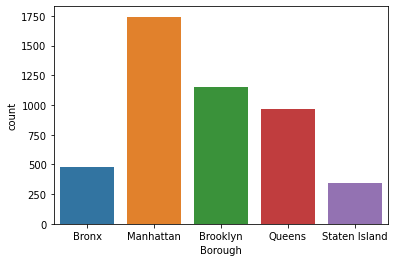

In [32]:
sns.countplot(restaurants_df.Borough)
plt.show()

We can see that Manhattan has many more restaurants.

Let's see the number of african restaurants by borough

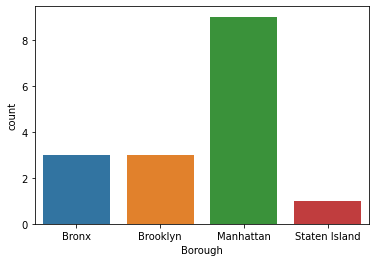

In [33]:
sns.countplot(african_restaurants.Borough)
plt.show()

We can see that Manhattan has many more restaurants than other boroughs. Our goal is to focus on the borough where there are a lot of people and few restaurants.

For that, let's see the population number of each borough.

In [34]:
pop = pd.read_csv("2020_population.csv")
pop = pop[pop['Age Group'] == 'Total'][['Borough', '2020']]
pop.rename(columns={'2020' : 'Population'}, inplace=True)
pop.drop(0, inplace=True)
pop.set_index('Borough', inplace=True)
pop.sort_values(by="Population",ascending=False)

,Population
Borough,
Brooklyn,2648452
Queens,2330295
Manhattan,1638281
Bronx,1446788
Staten Island,487155


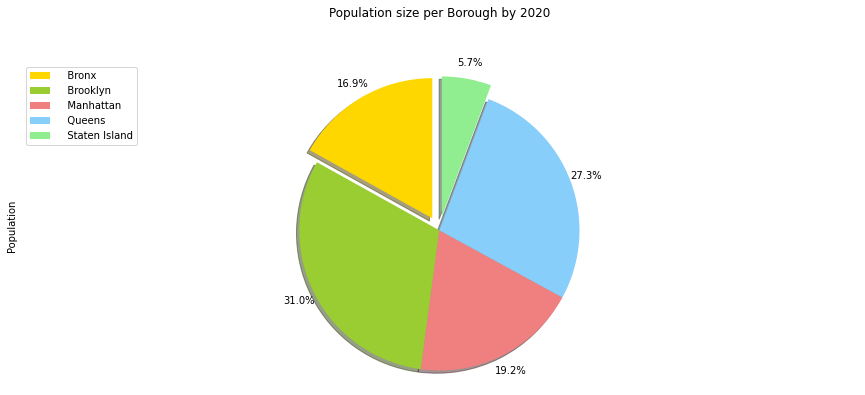

In [35]:
colors_list = ['gold', 'yellowgreen', 'lightcoral', 'lightskyblue', 'lightgreen']
explode_list = [0.1, 0, 0, 0, 0.1] # ratio for each continent with which to offset each wedge.

pop['Population'].plot(kind='pie',
                            figsize=(15, 6),
                            autopct='%1.1f%%', 
                            startangle=90,    
                            shadow=True,       
                            labels=None,         # turn off labels on pie chart
                            pctdistance=1.12,    # the ratio between the center of each pie slice and the start of the text generated by autopct 
                            colors=colors_list,  # add custom colors
                            explode=explode_list # 'explode' lowest 3 continents
                            )

# scale the title up by 12% to match pctdistance
plt.title('Population size per Borough by 2020', y=1.12) 

plt.axis('equal') 

# add legend
plt.legend(labels=pop.index, loc='upper left') 

plt.show()

We can see that Brooklyn is the most populated city and we saw earlier that it has fewer restaurants than Manhattan. So let's focus on **Brooklyn** 

In [0]:
brooklyn_restaurants = restaurants_df[restaurants_df['Borough'] == 'Brooklyn']

In [37]:
brooklyn_restaurants.head()

,Unnamed: 0,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category,Venue Category Id,Venue Distance,Is African,Borough,Latitude,Longitude
400,400,Bay Ridge,40.625801,-74.030621,Georgian Dream Cafe and Bakery,40.625586,-74.030196,Caucasian Restaurant,5293a7d53cf9994f4e043a45,43,False,Brooklyn,40.625801,-74.030621
401,401,Bay Ridge,40.625801,-74.030621,Karam,40.622931,-74.028316,Middle Eastern Restaurant,4bf58dd8d48988d115941735,374,False,Brooklyn,40.625801,-74.030621
402,402,Bay Ridge,40.625801,-74.030621,Elia Restaurant,40.623090,-74.031156,Greek Restaurant,4bf58dd8d48988d10e941735,305,False,Brooklyn,40.625801,-74.030621
403,403,Bay Ridge,40.625801,-74.030621,Tuscany Grill,40.622913,-74.031387,Italian Restaurant,4bf58dd8d48988d110941735,327,False,Brooklyn,40.625801,-74.030621
404,404,Bay Ridge,40.625801,-74.030621,Greenhouse Cafe,40.629542,-74.028514,American Restaurant,4bf58dd8d48988d14e941735,452,False,Brooklyn,40.625801,-74.030621


First of all, let's check the size of the resulting dataframe

In [38]:
#la_venues_restaurants = pd.DataFrame()
brooklyn_restaurants.shape

(1150, 14)

So we have 1150 restaurants.

**Now, let's see the restaurants in our map**

*African **restaurants** are in red and others in blue*

In [39]:
# create map of New York using latitude and longitude values
nw_map = folium.Map(location=[latitude, longitude], zoom_start=11)

# add markers to map
for lat, lng, venue, neighborhood, is_african in zip(brooklyn_restaurants['Venue Latitude'], brooklyn_restaurants['Venue Longitude'], brooklyn_restaurants['Venue'], brooklyn_restaurants['Neighborhood'], brooklyn_restaurants['Is African']):
    label = '{}, {}'.format(neighborhood, venue)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color= 'red' if is_african else 'blue',
        fill=True,
        fill_color =  'red' if is_african else 'blue',
        fill_opacity=0.7,
        parse_html=False).add_to(nw_map)

nw_map

We can see from this map that there aren't many African restaurants in Brooklyn. Our goal now is to find the places where there are not many restaurants of all kinds.

Let's find out how many unique categories can be curated from all the returned venues

In [40]:
print("There are {} uniques categories.".format(len(brooklyn_restaurants['Venue Category'].unique())))

There are 70 uniques categories.


Let's check how many restaurants of all kinds were returned for each neighborhood

In [41]:
brooklyn_restaurants.groupby('Neighborhood')[['Venue']].count().rename(columns={'Venue':'Total Numbers'})

,Total Numbers
Neighborhood,
Bath Beach,28
Bay Ridge,48
Bedford Stuyvesant,5
Bensonhurst,19
Bergen Beach,2
Boerum Hill,33
Borough Park,4
Brighton Beach,20
Broadway Junction,7


Let's check how many african restaurants were returned for each neighborhood

In [42]:
brooklyn_restaurants.groupby('Neighborhood')[['Is African']].sum().astype(int)

,Is African
Neighborhood,
Bath Beach,0
Bay Ridge,0
Bedford Stuyvesant,0
Bensonhurst,0
Bergen Beach,0
Boerum Hill,0
Borough Park,0
Brighton Beach,0
Broadway Junction,0


Let's check the number of African restaurants in Brooklyn

In [43]:
brooklyn_restaurants[brooklyn_restaurants['Is African'] == True].shape

(3, 14)

So we have just 3 african restaurants in Brooklyn.

Let's look for neighborhoods where there are no African restaurants and where there are the fewest other restaurants...

In [44]:
brooklyn_restaurants[brooklyn_restaurants['Is African'] == False].groupby('Neighborhood')[['Venue']].count().reset_index().sort_values(by="Venue",ascending=True).rename(columns={'Venue':'Total Numbers'})

,Neighborhood,Total Numbers
44,Marine Park,1
42,Manhattan Beach,1
4,Bergen Beach,2
18,Crown Heights,2
24,East Flatbush,2
66,Wingate,3
60,Starrett City,3
34,Gerritsen Beach,3
50,Paerdegat Basin,3
41,Madison,3


We can see now that some neighborhoods have fewer restaurants. Our goal is to focus on populated areas that have fewer restaurants and are not far from the city of **Downtown Brooklyn**.

Let's get the population size of each neighborhood in Brooklyn

In [0]:
ny_pop = pd.read_csv("New_York_City_Population_By_Neighborhood_Tabulation_Areas.csv")
brooklyn_neighborhoods_df = ny_pop[(ny_pop['Borough'] == 'Brooklyn') & (ny_pop['Year'] == 2010)]

In [46]:
brooklyn_neighborhoods_df.head()

,Borough,Year,FIPS County Code,NTA Code,NTA Name,Population
233,Brooklyn,2010,47,BK09,Brooklyn Heights-Cobble Hill,22887
234,Brooklyn,2010,47,BK17,Sheepshead Bay-Gerritsen Beach-Manhattn Bch,64518
235,Brooklyn,2010,47,BK19,Brighton Beach,35547
236,Brooklyn,2010,47,BK21,Seagate-Coney Island,31965
237,Brooklyn,2010,47,BK23,West Brighton,17750


In [0]:
# rename columns names
brooklyn_neighborhoods_df = brooklyn_neighborhoods_df[['NTA Name', 'Population']]
brooklyn_neighborhoods_df.rename(columns={'NTA Name' : 'Neighborhood'}, inplace=True)

Let's focus on the 50 most populated neighborhoods in 2010 in Brooklyn

In [48]:
brooklyn_neighborhoods_df = brooklyn_neighborhoods_df.sort_values(by='Population', ascending=False).head(50)
brooklyn_neighborhoods_df.head()

,Neighborhood,Population
277,Borough Park,106357
253,Flatbush,105804
261,Crown Heights North,103169
274,East New York,91958
241,Bensonhurst West,88727


Let's display Brooklyn's 50 most populous neighborhoods

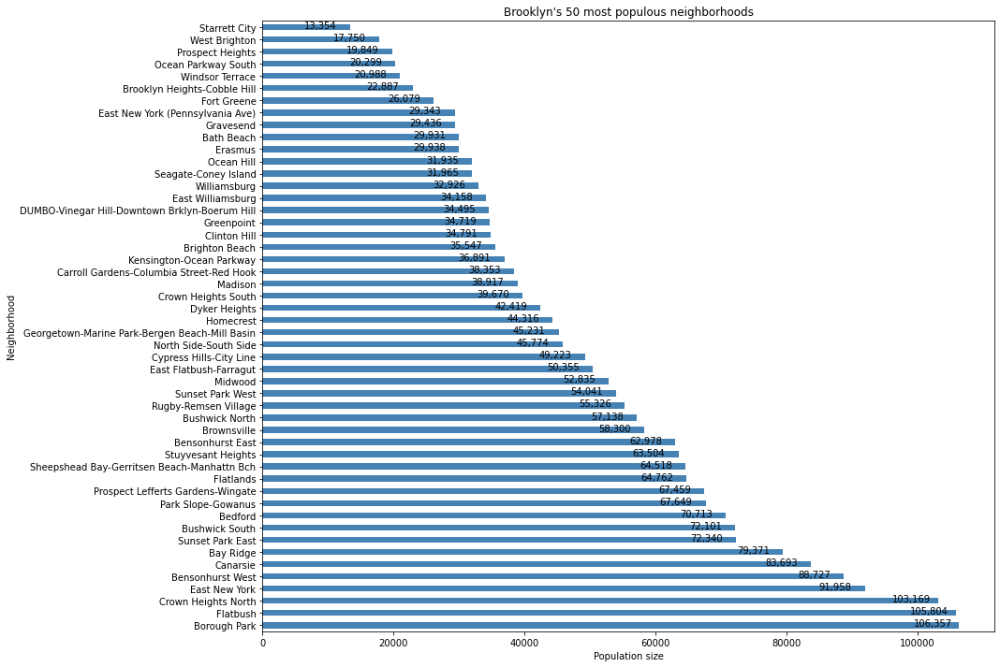

In [49]:
br_neighborhoods = brooklyn_neighborhoods_df.set_index('Neighborhood')
df_top50 = br_neighborhoods['Population']

df_top50.plot(kind='barh', figsize=(14, 12), color='steelblue')
plt.xlabel('Population size')
plt.title("Brooklyn's 50 most populous neighborhoods")

 # annotate value labels to each country
for index, value in enumerate(df_top50): 
    label = format(int(value), ',') # format int with commas
    # place text at the end of bar (subtracting 7000 from x, and 0.1 from y to make it fit within the bar)
    plt.annotate(label, xy=(value - 7000, index - 0.10), color='black')


Let's join Brooklyn's 50 most populous neighborhoods with their corresponding restaurants.

In [0]:
#other_restaurants are the restaurants that are not africans
brooklyn_neighborhoods = pd.merge(brooklyn_restaurants, brooklyn_neighborhoods_df, how='inner', on='Neighborhood')

In [51]:
brooklyn_neighborhoods.sort_values(by="Population",ascending=False).head()

,Unnamed: 0,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category,Venue Category Id,Venue Distance,Is African,Borough,Latitude,Longitude,Population
279,980,Borough Park,40.633131,-73.990498,Spoons,40.634364,-73.992624,Restaurant,4bf58dd8d48988d1c4941735,226,False,Brooklyn,40.633131,-73.990498,106357
280,981,Borough Park,40.633131,-73.990498,China Glatt,40.637381,-73.989255,Chinese Restaurant,4bf58dd8d48988d145941735,484,False,Brooklyn,40.633131,-73.990498,106357
281,982,Borough Park,40.633131,-73.990498,Vostok,40.631181,-73.995791,Eastern European Restaurant,4bf58dd8d48988d109941735,497,False,Brooklyn,40.633131,-73.990498,106357
278,979,Borough Park,40.633131,-73.990498,Orchidea,40.636390,-73.993899,American Restaurant,4bf58dd8d48988d14e941735,462,False,Brooklyn,40.633131,-73.990498,106357
114,561,Flatbush,40.636326,-73.958401,El Paso Mexican Grill,40.636081,-73.962079,Mexican Restaurant,4bf58dd8d48988d1c1941735,311,False,Brooklyn,40.636326,-73.958401,105804


Let's see the size of our data

In [52]:
brooklyn_neighborhoods.shape

(400, 15)

Let's check the number of restaurants in each of Brooklyn's neighborhoods.

In [53]:
brooklyn_restaurants_df = brooklyn_neighborhoods.groupby(['Neighborhood'])[['Venue']].count().reset_index().sort_values(by="Venue",ascending=True).rename(columns={'Venue':'Total Numbers'})
brooklyn_restaurants_df.head()

,Neighborhood,Total Numbers
20,Starrett City,3
17,Madison,3
2,Borough Park,4
7,Dyker Heights,4
12,Flatlands,5


Now let's focus on the 20 neighborhoods with the least number of restaurants

In [0]:
most_popular = brooklyn_restaurants_df.head(20)

In [55]:
most_popular.head()

,Neighborhood,Total Numbers
20,Starrett City,3
17,Madison,3
2,Borough Park,4
7,Dyker Heights,4
12,Flatlands,5


Let join the neighborhoods with its corresponding restaurants

In [0]:
most_populated_neighborhoods = pd.merge(most_popular, brooklyn_neighborhoods, on='Neighborhood', how='inner')
most_populated_neighborhoods = most_populated_neighborhoods[['Neighborhood', 'Neighborhood Latitude', 'Neighborhood Longitude', 'Venue', 'Venue Category','Venue Latitude',	'Venue Longitude', 'Population', 'Total Numbers']]

In [57]:
most_populated_neighborhoods.head()

,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Category,Venue Latitude,Venue Longitude,Population,Total Numbers
0,Starrett City,40.647589,-73.879370,Boston Market,American Restaurant,40.647250,-73.882550,13354,3
1,Starrett City,40.647589,-73.879370,Golden Krust Caribbean Restaurant,Caribbean Restaurant,40.647003,-73.883489,13354,3
2,Starrett City,40.647589,-73.879370,China Star,Chinese Restaurant,40.647055,-73.883689,13354,3
3,Madison,40.609378,-73.948415,Michael's,Italian Restaurant,40.607520,-73.943044,38917,3
4,Madison,40.609378,-73.948415,Meat heaven,American Restaurant,40.610330,-73.953798,38917,3


In [58]:
most_populated_neighborhoods.shape

(263, 9)

Finally, we have 263 restaurants in the 20 neighbourhoods with the fewest **restaurants** in Brooklyn.

Let's visualize these **restaurants**

In [59]:
# create map of Brooklyn using latitude and longitude values
latitude = 40.6782
longitude = -73.9442

state_geo_url = 'https://raw.githubusercontent.com/codeforamerica/click_that_hood/master/public/data/brooklyn.geojson'

state_geo = requests.get(state_geo_url).json() 

# create map of Brooklyn using latitude and longitude values
brooklyn_map = folium.Map(location=[latitude, longitude], zoom_start=11)

folium.Marker(
    [latitude, longitude],
    popup='Brooklyn'
).add_to(brooklyn_map)

# add markers to map
for lat, lng, venue, neighborhood in zip(most_populated_neighborhoods['Venue Latitude'], most_populated_neighborhoods['Venue Longitude'], most_populated_neighborhoods['Venue'], most_populated_neighborhoods['Neighborhood']):
    label = '{}, {}'.format(neighborhood, venue)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='blue',
        fill=True,
        fill_color =  'blue',
        fill_opacity=0.7,
        parse_html=False).add_to(brooklyn_map)

folium.Choropleth(
    geo_data=state_geo,
    name='choropleth',
    fill_color='YlGn',
    fill_opacity=0.3,
    line_opacity=0.2,
).add_to(brooklyn_map)
    
brooklyn_map

Now let's check the neighborhoods that are not far from the center **Downtown Brooklyn**

In [0]:
downtown_brooklyn_lat, downtown_brooklyn_long = 40.6961, 73.9845

In [0]:
from math import sin, cos, sqrt, atan2, radians

def distance_between_neighborhoods(latitude1, longitude1):
  '''This function is used to calculate the distance between a given neighborhood and downtown Brooklyn. '''

  # approximate radius of earth in km
  R = 6373.0
  distance = []
  
  for lat, long in zip(latitude1, longitude1):
    lat1 = radians(lat)
    lon1 = radians(abs(long))
    lat2 = radians(downtown_brooklyn_lat)
    lon2 = radians(abs(downtown_brooklyn_long))

    dlon = lon2 - lon1
    dlat = lat2 - lat1

    a = sin(dlat / 2)**2 + cos(lat1) * cos(lat2) * sin(dlon / 2)**2
    c = 2 * atan2(sqrt(a), sqrt(1 - a))

    distance.append(R * c)

  return distance

Let's calculate the distance between each **neighborhood** and **Downtown Brooklyn**...

In [0]:
most_populated_neighborhoods['distance km'] = None
most_populated_neighborhoods['distance km'] = most_populated_neighborhoods.apply(lambda x: distance_between_neighborhoods(most_populated_neighborhoods['Neighborhood Latitude'], most_populated_neighborhoods['Neighborhood Longitude']), axis=0)

In [63]:
most_populated_neighborhoods.head()

,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Category,Venue Latitude,Venue Longitude,Population,Total Numbers,distance km
0,Starrett City,40.647589,-73.879370,Boston Market,American Restaurant,40.647250,-73.882550,13354,3,10.381522
1,Starrett City,40.647589,-73.879370,Golden Krust Caribbean Restaurant,Caribbean Restaurant,40.647003,-73.883489,13354,3,10.381522
2,Starrett City,40.647589,-73.879370,China Star,Chinese Restaurant,40.647055,-73.883689,13354,3,10.381522
3,Madison,40.609378,-73.948415,Michael's,Italian Restaurant,40.607520,-73.943044,38917,3,10.115332
4,Madison,40.609378,-73.948415,Meat heaven,American Restaurant,40.610330,-73.953798,38917,3,10.115332


Let's look at the smaller distances

In [64]:
most_populated_neighborhoods.sort_values(by="distance km",ascending=True).head()

,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Category,Venue Latitude,Venue Longitude,Population,Total Numbers,distance km
111,Williamsburg,40.707144,-73.958115,La Isla Restaurant,Latin American Restaurant,40.708515,-73.958186,32926,15,2.541511
114,Williamsburg,40.707144,-73.958115,Klein's Kraitchma,Food Truck,40.704200,-73.961599,32926,15,2.541511
113,Williamsburg,40.707144,-73.958115,Good Friend,Chinese Restaurant,40.708821,-73.959696,32926,15,2.541511
112,Williamsburg,40.707144,-73.958115,El Emperador Elias,Latin American Restaurant,40.708725,-73.958822,32926,15,2.541511
110,Williamsburg,40.707144,-73.958115,Cafe El Puente,Caribbean Restaurant,40.710448,-73.958921,32926,15,2.541511


We find that the shortest distances are **~3km** from downtown Brooklyn.

Our goal now is to focus on neighborhoods that are no more than 5 km from **Downtown Brooklyn**

In [0]:
most_populated_neighborhoods = most_populated_neighborhoods[most_populated_neighborhoods['distance km'] < 5]

In [66]:
most_populated_neighborhoods.head()

,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Category,Venue Latitude,Venue Longitude,Population,Total Numbers,distance km
85,Windsor Terrace,40.656946,-73.980073,Bedawi Cafe,Middle Eastern Restaurant,40.658588,-73.982020,20988,15,4.37109
86,Windsor Terrace,40.656946,-73.980073,Krupa Grocery,American Restaurant,40.659957,-73.980696,20988,15,4.37109
87,Windsor Terrace,40.656946,-73.980073,East Wind Snack Shop,Chinese Restaurant,40.660297,-73.980169,20988,15,4.37109
88,Windsor Terrace,40.656946,-73.980073,Sushi Yama,Sushi Restaurant,40.658542,-73.982054,20988,15,4.37109
89,Windsor Terrace,40.656946,-73.980073,Giovanni's Brooklyn Eats,Italian Restaurant,40.660159,-73.983753,20988,15,4.37109


Let see the number of Venue we have now

In [67]:
print("We have {} venues that are no more than 5 km from downtown Brooklyn.".format(most_populated_neighborhoods.shape[0]))

We have 113 venues that are no more than 5 km from downtown Brooklyn.


Let's see what neighborhoods we finally got

In [68]:
most_populated_neighborhoods['Neighborhood'].unique()

array(['Windsor Terrace', 'Williamsburg', 'East Williamsburg',
       'Greenpoint', 'Prospect Heights'], dtype=object)

Let's look at the average distance of each of these neighborhoods

In [69]:
for neighborhood in most_populated_neighborhoods['Neighborhood'].unique():
  print("The average distance for {} is {} km".format(neighborhood, most_populated_neighborhoods[most_populated_neighborhoods['Neighborhood'] == neighborhood]['distance km'].mean()))
  print("The number of non-african restaurants is {}".format(most_populated_neighborhoods[most_populated_neighborhoods['Neighborhood'] == neighborhood]['Total Numbers'].unique()[0]))
  print("{}'s population size is {} ".format(neighborhood, most_populated_neighborhoods[most_populated_neighborhoods['Neighborhood'] == neighborhood]['Population'].unique()[0]))
  print('\n')

The average distance for Windsor Terrace is 4.371090370531356 km
The number of non-african restaurants is 15
Windsor Terrace's population size is 20988 


The average distance for Williamsburg is 2.541511044143831 km
The number of non-african restaurants is 15
Williamsburg's population size is 32926 


The average distance for East Williamsburg is 4.0881053201884 km
The number of non-african restaurants is 21
East Williamsburg's population size is 34158 


The average distance for Greenpoint is 4.571171385078824 km
The number of non-african restaurants is 31
Greenpoint's population size is 34719 


The average distance for Prospect Heights is 2.7096356622392506 km
The number of non-african restaurants is 31
Prospect Heights's population size is 19849 




Let's display the venues of these neighborhoods in Brooklyn

In [70]:
# create map of Brooklyn using latitude and longitude values
brooklyn_map = folium.Map(location=[downtown_brooklyn_lat, -downtown_brooklyn_long], zoom_start=11)

folium.Marker(
    [downtown_brooklyn_lat, -downtown_brooklyn_long],
    popup='Downtown Brooklyn'
).add_to(brooklyn_map)

colors = {}
for n in most_populated_neighborhoods['Neighborhood'].unique():
    colors[n] = ('#%06X' % randint(0, 0xFFFFFF))

# add markers to map
for lat, lng, venue, neighborhood, distance in zip(most_populated_neighborhoods['Venue Latitude'], most_populated_neighborhoods['Venue Longitude'], most_populated_neighborhoods['Venue'], most_populated_neighborhoods['Neighborhood'], most_populated_neighborhoods['distance km']):
    label = '{}, {}'.format(neighborhood, venue)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color= colors[neighborhood],
        fill=True,
        fill_color = colors[neighborhood],
        fill_opacity=0.9,
        parse_html=False).add_to(brooklyn_map)

folium.Choropleth(
    geo_data=state_geo,
    name='choropleth',
    fill_color='YlGn',
    fill_opacity=0.1,
    line_opacity=0.2,
).add_to(brooklyn_map)

brooklyn_map

 ## Analyze Each Neighborhood

We now have the neighbourhoods with the **fewest restaurants** within **5 km** of **downtown Brooklyn**.

Now, let's display the most visited places in each neighbourhood to help the business owner get an idea of each neighbourhood.

In [0]:
# one hot encoding
neighborhoods_onehot = pd.get_dummies(most_populated_neighborhoods[['Venue Category']], prefix="", prefix_sep="")
# add neighborhood column back to dataframe
neighborhoods_onehot['Neighborhood'] = most_populated_neighborhoods['Neighborhood']

# move neighborhood column to the first column
fixed_columns = [neighborhoods_onehot.columns[-1]] + list(neighborhoods_onehot.columns[:-1])
neighborhoods_onehot = neighborhoods_onehot[fixed_columns]

In [84]:
neighborhoods_onehot.head()

,Neighborhood,American Restaurant,Asian Restaurant,Cajun / Creole Restaurant,Caribbean Restaurant,Chinese Restaurant,Diner,Empanada Restaurant,Falafel Restaurant,Food,Food Truck,French Restaurant,Greek Restaurant,Indian Restaurant,Italian Restaurant,Japanese Restaurant,Korean Restaurant,Latin American Restaurant,Mediterranean Restaurant,Mexican Restaurant,Middle Eastern Restaurant,New American Restaurant,North Indian Restaurant,Polish Restaurant,Ramen Restaurant,Restaurant,Seafood Restaurant,Southern / Soul Food Restaurant,Steakhouse,Sushi Restaurant,Taiwanese Restaurant,Tapas Restaurant,Thai Restaurant,Vegetarian / Vegan Restaurant,Vietnamese Restaurant
85,Windsor Terrace,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0
86,Windsor Terrace,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
87,Windsor Terrace,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
88,Windsor Terrace,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0
89,Windsor Terrace,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


And let's examine the new dataframe size.

In [85]:
neighborhoods_onehot.shape

(113, 35)

Next, let's group rows by venue and by taking the mean of the frequency of occurrence of each category

In [86]:
neighborhoods_grouped = neighborhoods_onehot.groupby('Neighborhood').mean().reset_index()
neighborhoods_grouped.head()

,Neighborhood,American Restaurant,Asian Restaurant,Cajun / Creole Restaurant,Caribbean Restaurant,Chinese Restaurant,Diner,Empanada Restaurant,Falafel Restaurant,Food,Food Truck,French Restaurant,Greek Restaurant,Indian Restaurant,Italian Restaurant,Japanese Restaurant,Korean Restaurant,Latin American Restaurant,Mediterranean Restaurant,Mexican Restaurant,Middle Eastern Restaurant,New American Restaurant,North Indian Restaurant,Polish Restaurant,Ramen Restaurant,Restaurant,Seafood Restaurant,Southern / Soul Food Restaurant,Steakhouse,Sushi Restaurant,Taiwanese Restaurant,Tapas Restaurant,Thai Restaurant,Vegetarian / Vegan Restaurant,Vietnamese Restaurant
0,East Williamsburg,0.000000,0.000000,0.000000,0.000000,0.047619,0.000000,0.047619,0.047619,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.047619,0.000000,0.047619,0.047619,0.238095,0.047619,0.000000,0.000000,0.000000,0.047619,0.047619,0.047619,0.000000,0.000000,0.000000,0.047619,0.000000,0.142857,0.095238,0.000000
1,Greenpoint,0.032258,0.000000,0.000000,0.000000,0.129032,0.000000,0.000000,0.032258,0.032258,0.000000,0.096774,0.000000,0.032258,0.064516,0.000000,0.000000,0.000000,0.032258,0.129032,0.032258,0.064516,0.000000,0.064516,0.000000,0.096774,0.000000,0.000000,0.000000,0.096774,0.000000,0.000000,0.032258,0.000000,0.032258
2,Prospect Heights,0.064516,0.032258,0.032258,0.032258,0.000000,0.064516,0.000000,0.032258,0.000000,0.000000,0.000000,0.000000,0.000000,0.032258,0.032258,0.032258,0.032258,0.000000,0.193548,0.000000,0.064516,0.032258,0.000000,0.032258,0.064516,0.000000,0.064516,0.000000,0.032258,0.000000,0.000000,0.096774,0.000000,0.032258
3,Williamsburg,0.066667,0.000000,0.000000,0.066667,0.066667,0.066667,0.000000,0.000000,0.000000,0.066667,0.000000,0.066667,0.000000,0.066667,0.066667,0.066667,0.200000,0.000000,0.000000,0.066667,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.066667,0.000000,0.000000,0.066667,0.000000,0.000000,0.000000
4,Windsor Terrace,0.066667,0.000000,0.000000,0.000000,0.133333,0.133333,0.000000,0.000000,0.000000,0.000000,0.066667,0.066667,0.066667,0.066667,0.066667,0.000000,0.000000,0.000000,0.066667,0.066667,0.000000,0.000000,0.000000,0.000000,0.066667,0.000000,0.000000,0.000000,0.133333,0.000000,0.000000,0.000000,0.000000,0.000000


Let's confirm the new size

In [87]:
neighborhoods_grouped.shape

(5, 35)

Let's print each category along with the top 5 most common venues

In [94]:
num_top_venues = 5

for category in neighborhoods_grouped['Neighborhood']:
    print("----"+category+"----")
    temp = neighborhoods_grouped[neighborhoods_grouped['Neighborhood'] == category].T.reset_index()
    temp.columns = ['venue','freq']
    temp = temp.iloc[1:]
    temp['freq'] = temp['freq'].astype(float)
    temp = temp.round({'freq': 2})
    print(temp.sort_values('freq', ascending=False).reset_index(drop=True).head(num_top_venues))
    print('\n')

----East Williamsburg----
                           venue  freq
0             Mexican Restaurant  0.24
1                Thai Restaurant  0.14
2  Vegetarian / Vegan Restaurant  0.10
3       Mediterranean Restaurant  0.05
4             Seafood Restaurant  0.05


----Greenpoint----
                venue  freq
0  Chinese Restaurant  0.13
1  Mexican Restaurant  0.13
2    Sushi Restaurant  0.10
3          Restaurant  0.10
4   French Restaurant  0.10


----Prospect Heights----
                             venue  freq
0               Mexican Restaurant  0.19
1                  Thai Restaurant  0.10
2              American Restaurant  0.06
3  Southern / Soul Food Restaurant  0.06
4                            Diner  0.06


----Williamsburg----
                       venue  freq
0  Latin American Restaurant  0.20
1        American Restaurant  0.07
2                 Food Truck  0.07
3  Middle Eastern Restaurant  0.07
4          Korean Restaurant  0.07


----Windsor Terrace----
                 ve

Let's put that into a pandas dataframe

First, let's write a function to sort the venues in descending order.

In [0]:
def return_most_common_venues(row, num_top_venues):
    row_categories = row.iloc[1:]
    row_categories_sorted = row_categories.sort_values(ascending=False)
    
    return row_categories_sorted.index.values[0:num_top_venues]

Now let's create the new dataframe and display the top 5 venues for each neighborhood.

In [96]:
num_top_venues = 5

indicators = ['st', 'nd', 'rd']

# create columns according to number of top venues
columns = ['Neighborhood']
for ind in np.arange(num_top_venues):
    try:
        columns.append('{}{} Most Common Venue'.format(ind+1, indicators[ind]))
    except:
        columns.append('{}th Most Common Venue'.format(ind+1))

# create a new dataframe
neighborhoods_venues_sorted = pd.DataFrame(columns=columns)
neighborhoods_venues_sorted['Neighborhood'] = neighborhoods_grouped['Neighborhood']

for ind in np.arange(neighborhoods_grouped.shape[0]):
    neighborhoods_venues_sorted.iloc[ind, 1:] = return_most_common_venues(neighborhoods_grouped.iloc[ind, :], num_top_venues)

neighborhoods_venues_sorted.head()

,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue
0,East Williamsburg,Mexican Restaurant,Thai Restaurant,Vegetarian / Vegan Restaurant,Latin American Restaurant,Mediterranean Restaurant
1,Greenpoint,Chinese Restaurant,Mexican Restaurant,Sushi Restaurant,French Restaurant,Restaurant
2,Prospect Heights,Mexican Restaurant,Thai Restaurant,American Restaurant,Diner,Southern / Soul Food Restaurant
3,Williamsburg,Latin American Restaurant,Middle Eastern Restaurant,Caribbean Restaurant,Chinese Restaurant,Diner
4,Windsor Terrace,Sushi Restaurant,Chinese Restaurant,Diner,American Restaurant,French Restaurant


## Cluster Neighborhoods

Run k-means to cluster the neighborhoods into 3 clusters.

In [97]:
# set number of clusters
kclusters = 3

neighborhoods_grouped_clustering = neighborhoods_grouped.drop('Neighborhood', 1)

# run k-means clustering
kmeans = KMeans(n_clusters=kclusters, random_state=0).fit(neighborhoods_grouped_clustering)

# check cluster labels generated for each row in the dataframe
kmeans.labels_[0:10] 

array([1, 0, 1, 2, 0], dtype=int32)

In [98]:
kmeans.labels_

array([1, 0, 1, 2, 0], dtype=int32)

Let's create a new dataframe that includes the cluster as well as the top 5 venues for each category.

In [0]:
# add clustering labels
neighborhoods_venues_sorted.insert(0, 'Cluster Labels', kmeans.labels_)

neighborhoods_merged = most_populated_neighborhoods[['Neighborhood', 'Neighborhood Latitude', 'Neighborhood Longitude', 'Total Numbers', 'distance km', 'Population']]

# merge toronto_grouped with toronto_data to add latitude/longitude for each neighborhood
neighborhoods_merged = neighborhoods_merged.join(neighborhoods_venues_sorted.set_index('Neighborhood'), on='Neighborhood')
neighborhoods_merged.drop_duplicates(inplace=True)

In [100]:
neighborhoods_merged

,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Total Numbers,distance km,Population,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue
85,Windsor Terrace,40.656946,-73.980073,15,4.371090,20988,0,Sushi Restaurant,Chinese Restaurant,Diner,American Restaurant,French Restaurant
100,Williamsburg,40.707144,-73.958115,15,2.541511,32926,2,Latin American Restaurant,Middle Eastern Restaurant,Caribbean Restaurant,Chinese Restaurant,Diner
152,East Williamsburg,40.708492,-73.938858,21,4.088105,34158,1,Mexican Restaurant,Thai Restaurant,Vegetarian / Vegan Restaurant,Latin American Restaurant,Mediterranean Restaurant
201,Greenpoint,40.730201,-73.954241,31,4.571171,34719,0,Chinese Restaurant,Mexican Restaurant,Sushi Restaurant,French Restaurant,Restaurant
232,Prospect Heights,40.676822,-73.964859,31,2.709636,19849,1,Mexican Restaurant,Thai Restaurant,American Restaurant,Diner,Southern / Soul Food Restaurant


Finally, let's visualize the resulting clusters

In [103]:
# create map
map_clusters = folium.Map(location=[latitude, longitude], zoom_start=11)

# set color scheme for the clusters
colors = ['red', 'blue', 'green']

folium.CircleMarker(
    [downtown_brooklyn_lat, -downtown_brooklyn_long],
    popup='Downtown Brooklyn',
    radius=100,
    color='#3186cc',
    fill=True,
    fill_color='#3186cc'
).add_to(map_clusters)


for lat, lon, neighborhood, cluster, distance, population, nbr_restaurant in zip(neighborhoods_merged['Neighborhood Latitude'], neighborhoods_merged['Neighborhood Longitude'], neighborhoods_merged['Neighborhood'], neighborhoods_merged['Cluster Labels'], neighborhoods_merged['distance km'], neighborhoods_merged['Population'], neighborhoods_merged['Total Numbers']):
    label = folium.Popup(str(neighborhood) + ' Cluster ' + str(cluster) + ' ' + str(distance) + "km Pop:" +  str(population) + " Rest :" + str(nbr_restaurant), parse_html=True)
    folium.Marker(
      location=[lat, lon],
      popup=label,
      icon=folium.Icon(color=colors[cluster], icon='map-marker')
    ).add_to(map_clusters)



map_clusters

In this map, the circle corresponds to downtown Brooklyn projected at 100 radius.

## 5. Results and Discussion <a name="results"></a>

In this project, the first thing we saw was that there are a lot of restaurants in New York City. That's why we continued the analysis on Brooklyn, which is the most populous borough in New York. Then we focused on the 50 most populous neighborhoods in Brooklyn. This allowed us to select the 20 smallest restaurants in these neighborhoods. Since we would like to have neighborhoods that are not far from the center, we focused only on neighborhoods that are no more than five kilometres from downtown Brooklyn. In the end, we came up with 5 neighborhoods that met our expectations.

Then, With the results of the cluster, the business owner could choose in which neighborhood he would like to open his African restaurant. 

If he wants the closest location with the fewest restaurants, he could choose Williamsburg (Cluster 2). In this neighborhood, the most common locations are Latin American and Middle Eastern restaurants. 

If he wishes to be in a place where there are a lot of Asian restaurants (Chinese, Japanese,...), he could choose Cluster 0 (Greenpoint or Windsor Terrace).

If he wants to be in a place where there are a lot of Latin American restaurants, he could choose Cluster 1 (Prospect Heights or East Williamsburg).


## 6. Conclusion <a name="conclusion"></a>

The aim of this project was to help an entrepreneur or business leader to open his African restaurant in Now York. To do this, first of all, it was necessarily a matter of choosing a place where there were not enough restaurants (and no African restaurants). Second, the location must not be far from the city. Thirdly, it must necessarily be a place where there are lots of people.

The aim of this project was to help an entrepreneur or business leader open his African restaurant in Now York. The first step was to choose a location where there were not enough restaurants (and no African restaurants). Then the location had to be close to the city. Third, it had to be a place where there were lots of people.

The entrepreneur or business owner can choose between the proposed neighborhoods. But to improve these results, other factors could be taken into account. For example, to see which neighbourhoods are the safest, the areas most visited by tourists, rental prices, ...